## This code creates an image classifier using the bing search API and fastai neural net

In [ ]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

In [2]:
APIKEY='xxx'
key = os.environ.get('AZURE_SEARCH_KEY', APIKEY)

In [3]:
search_images_bing

# def search_images_bing(key, term, min_sz=128, max_images=150):    
#      params = {'q':term, 'count':max_images, 'min_height':min_sz, 'min_width':min_sz}
#      headers = {"Ocp-Apim-Subscription-Key":key}
#      search_url = "https://api.bing.microsoft.com/v7.0/images/search"
#      response = requests.get(search_url, headers=headers, params=params)
#      response.raise_for_status()
#      search_results = response.json()    
#      return L(search_results['value'])

<function fastbook.search_images_bing>

In [4]:
### 7 modern wonders of the world

# Great Wall of China
# Christ the Redeemer in Rio de Janeiro
# Machu Picchu in Peru
# Chichen Itza
# Roman Colosseum
# Taj Mahal in India
# Petra in Jordan

results = search_images_bing(key, 'Christ the Redeemer in Rio de Janeiro')
ims = results.attrgot('content_url')
len(ims)

150

Get training data from bing image search, save images in folder named for label

In [5]:
wonder_types = 'Christ the Redeemer','Machu Picchu','Taj Mahal', 'Petra', 'Chichen Itza', 'Great Wall of China', 'Roman Colosseum'
path = Path('wonders')

In [6]:
if not path.exists():
    path.mkdir()
    for o in wonder_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [7]:
fns = get_image_files(path)
fns

(#996) [Path('wonders/Chichen Itza/00000036.jpg'),Path('wonders/Chichen Itza/00000029.jpg'),Path('wonders/Chichen Itza/00000094.jpg'),Path('wonders/Chichen Itza/00000082.jpg'),Path('wonders/Chichen Itza/00000021.jpg'),Path('wonders/Chichen Itza/00000126.jpg'),Path('wonders/Chichen Itza/00000025.jpg'),Path('wonders/Chichen Itza/00000091.jpg'),Path('wonders/Chichen Itza/00000019.jpeg'),Path('wonders/Chichen Itza/00000102.jpg')...]

In [8]:
### detect corrupt images
failed = verify_images(fns)
failed

(#9) [Path('wonders/Chichen Itza/00000054.jpg'),Path('wonders/Chichen Itza/00000004.jpg'),Path('wonders/Taj Mahal/00000059.jpg'),Path('wonders/Taj Mahal/00000055.jpg'),Path('wonders/Taj Mahal/00000133.jpg'),Path('wonders/Roman Colosseum/00000082.jpg'),Path('wonders/Petra/00000017.jpg'),Path('wonders/Machu Picchu/00000110.jpg'),Path('wonders/Machu Picchu/00000137.jpg')]

In [9]:
## remove corrupt images
failed.map(Path.unlink);

create fastai datablock object

In [10]:
### fastai datablock object
wonders = DataBlock(
    ### what is the IV and DV (lables and inputs)
    blocks=(ImageBlock, CategoryBlock), 
    ## function to get list of all filenames
    get_items=get_image_files, 
    ### how to split data into validation set and training set
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    ## how to label the data (uses a predefined function - usually file is in folder according to label)
    get_y=parent_label,
    ## functions that get applied to every image, for example resizing each image
    item_tfms=Resize(128))

In [11]:
dls = wonders.dataloaders(path)

View training data and image cleaning techniques (random resize crop and image augmentation)

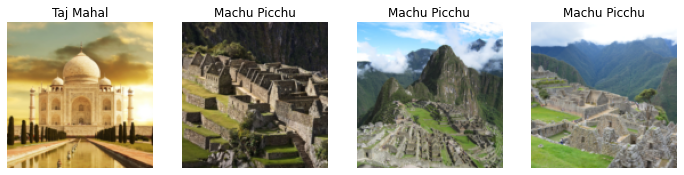

In [12]:
### show training data
dls.valid.show_batch(max_n=4, nrows=1)

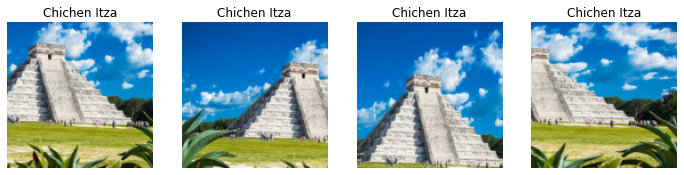

In [13]:
### view random resize crop images
wonders = wonders.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = wonders.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

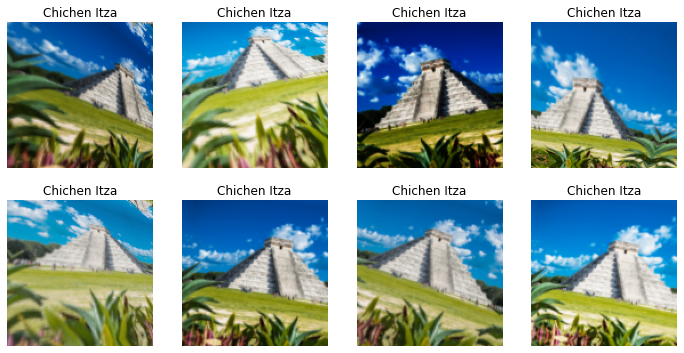

In [14]:
### view data augmentation
wonders = wonders.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = wonders.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [15]:
### apply random resize crop and data augmentation to your images
wonders = wonders.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = wonders.dataloaders(path)

create 4 layer neural net

In [16]:
### create model to recognize images of the 7 wonders of the modern world
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.689869,0.641205,0.177665,00:37


epoch,train_loss,valid_loss,error_rate,time
0,0.361748,0.385056,0.106599,00:38
1,0.268191,0.349137,0.096447,00:38
2,0.186059,0.313965,0.086294,00:38
3,0.141402,0.303486,0.081218,00:38


Examine accuracy of model using classification matrix

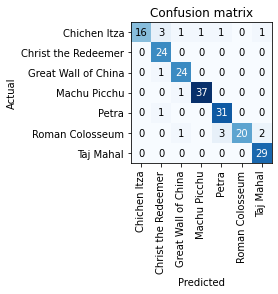

In [17]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

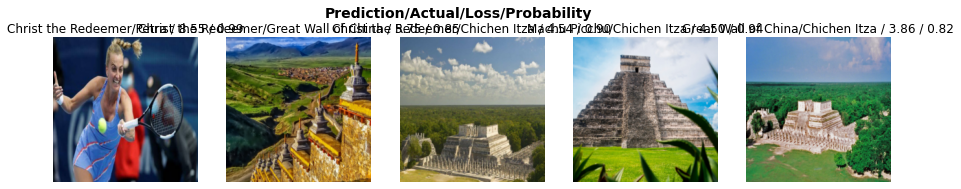

In [18]:
### very useful function to view misclassifications/errors
interp.plot_top_losses(5, nrows=1)

In [19]:
### use the UI to view questionable images in data
cleaner = ImageClassifierCleaner(learn)
cleaner

## Example of exporting/loading model, using widgets to create proof-of-concept

In [20]:
#hide
### remove selected images
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [21]:
### this is how you get a model into production - model is treated as a pre-defined program
learn.export()
path = Path()
path.ls(file_exts='.pkl')
learn_inf = load_learner(path/'export.pkl')

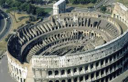

In [25]:
# ims = ['https://en.wikipedia.org/wiki/Machu_Picchu#/media/File:Machu_Picchu,_Peru.jpg']
# dest = '/content/machupicchu.jpg'
# download_url(ims[0], dest)
im = Image.open('colosseum.jpg')
im.to_thumb(128,128)


make predictions using model

In [26]:
learn_inf.predict('colosseum.jpg')

('Roman Colosseum',
 tensor(5),
 tensor([2.6308e-03, 2.9934e-05, 8.6608e-04, 1.3300e-04, 5.8481e-02, 9.3752e-01, 3.3600e-04]))

use .vocab to examine labels of tensors (printed above)

In [24]:
learn_inf.dls.vocab

['Chichen Itza', 'Christ the Redeemer', 'Great Wall of China', 'Machu Picchu', 'Petra', 'Roman Colosseum', 'Taj Mahal']

Use widgets to create rudimentary UI

In [27]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['colosseum.jpg'])

In [28]:
img = PILImage.create(btn_upload.data[-1])

In [29]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [30]:
pred,pred_idx,probs = learn_inf.predict(img)

In [31]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: Roman Colosseum; Probability: 0.9375')

In [32]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [33]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [34]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [35]:
#hide_output
VBox([widgets.Label('Upload image!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [35]:
#hide
# !pip install voila
# !jupyter serverextension enable --sys-prefix voila 

     |████████████████████████████████| 2.5MB 13.6MB/s 
     |████████████████████████████████| 122kB 56.8MB/s 
     |████████████████████████████████| 552kB 45.0MB/s 
     |████████████████████████████████| 245kB 57.2MB/s 
     |████████████████████████████████| 71kB 10.0MB/s 
ERROR: nbdev 1.1.13 has requirement nbconvert<6, but you'll have nbconvert 6.0.7 which is incompatible.
ERROR: jupyter-server 1.4.1 has requirement tornado>=6.1.0, but you'll have tornado 5.1.1 which is incompatible.
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbconvert-5.6.1


Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
